Automatically detect rotation and line spacing of an image of text using
Radon transform
If image is rotated by the inverse of the output, the lines will be
horizontal (though they may be upside-down depending on the original image)
It doesn't work with black borders

In [2]:
from __future__ import division, print_function
from skimage.transform import radon
from PIL import Image
from numpy import asarray, mean, array, blackman
import numpy
from numpy.fft import rfft
import matplotlib.pyplot as plt
from matplotlib.mlab import rms_flat
try:
    # More accurate peak finding from
    # https://gist.github.com/endolith/255291#file-parabolic-py
    from parabolic import parabolic

    def argmax(x):
        return parabolic(x, numpy.argmax(x))[0]
except ImportError:
    from numpy import argmax

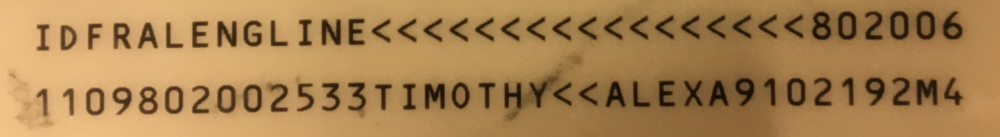

In [15]:
filename = '../OCR_LEARN/eng.ocrb.exp13.jpg'
img = Image.open(filename)
img

In [16]:
# Load file, converting to grayscale
I = asarray(Image.open(filename).convert('L'))
I = I - mean(I)

In [22]:
# Do the radon transform and display the result
sinogram = radon(I)

In [23]:
# Find the RMS value of each row and find "busiest" rotation,
# where the transform is lined up perfectly with the alternating dark
# text and white lines
r = array([rms_flat(line) for line in sinogram.transpose()])
rotation = argmax(r)
print('Rotation: {:.2f} degrees'.format(90 - rotation))

Rotation: 26.00 degrees


In [30]:
img2 = img.rotate(90 - rotation, expand=True)
img2.convert('L').save("img_rotated.jpg") #save a grayscale version of the image ?

## TEST PART

In [31]:
test = '../OCR_LEARN/eng.ocrb.exp16.jpg'
imgtest = Image.open(test)
imgtest = imgtest.rotate(154, expand=True)
I = asarray(imgtest.convert('L'))
I = I - mean(I)

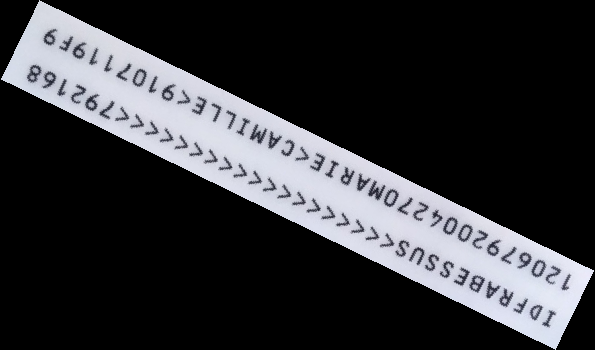

In [36]:
imgtest

In [33]:
img3 = imgtest.rotate(90 - rotation, expand=True)

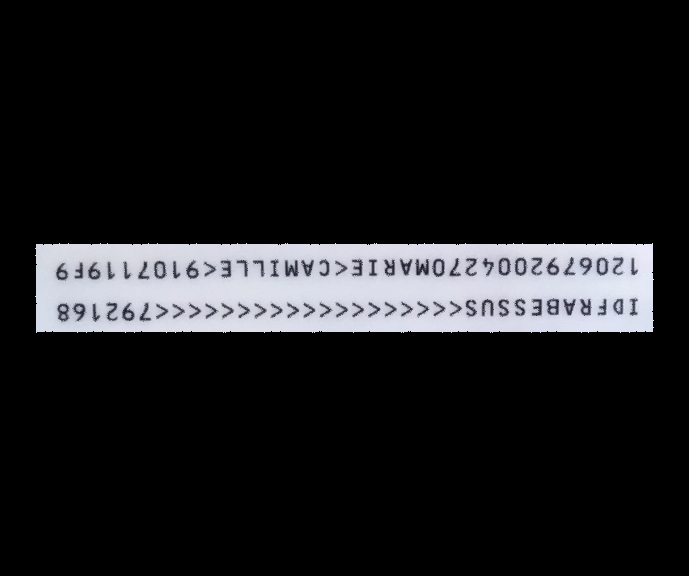

In [38]:
img3

In [3]:
test2 = './TEST0416.jpg'
imgtest2 = Image.open(test2)
imgtest2 = imgtest2.rotate(154, expand=True)
I2 = asarray(imgtest2.convert('L'))
I2 = I2 - mean(I2)

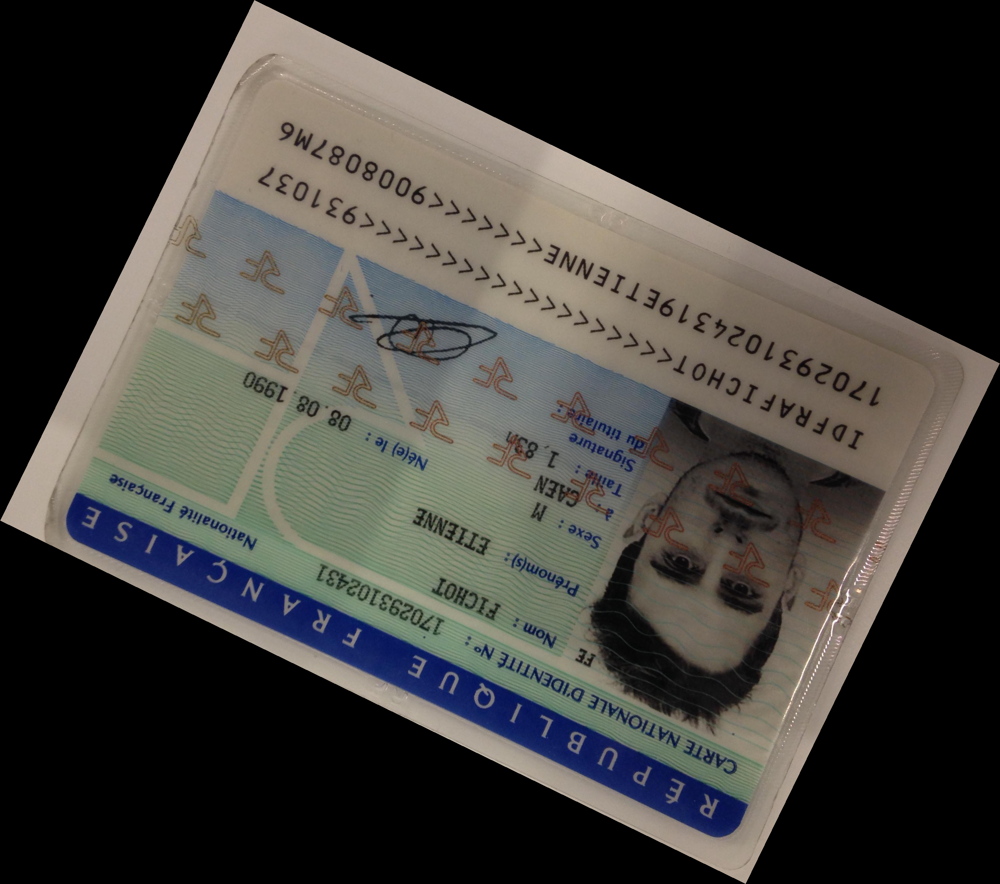

In [4]:
imgtest2

In [5]:
sinogram2 = radon(I2)
r2 = array([rms_flat(line) for line in sinogram2.transpose()])
rotation2 = argmax(r2)
print('Rotation: {:.2f} degrees'.format(90 - rotation2))

/Users/tlenglin/Library/Python/2.7/lib/python/site-packages/skimage/transform/radon_transform.py:58: UserWarning: The default of `circle` in `skimage.transform.radon` will change to `True` in version 0.15.
  warn('The default of `circle` in `skimage.transform.radon` '


Rotation: 26.00 degrees


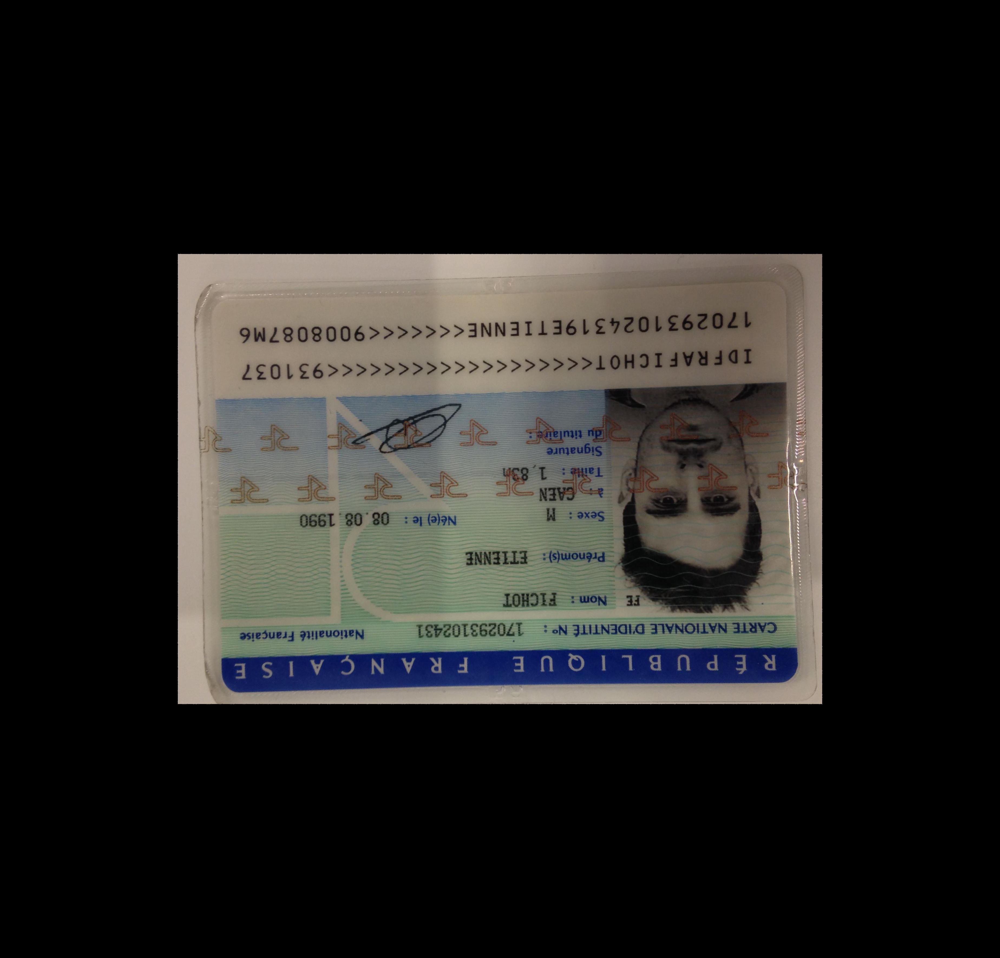

In [6]:
img5 = imgtest2.rotate(90 - rotation2, expand=True)
img5